In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
# https://www.kaggle.com/burakhmmtgl/energy-molecule
df = pd.read_csv("./molecules/roboBohr.csv")

In [4]:
df.head()

,Unnamed: 0,0,1,2,3,4,5,6,7,8,...,1267,1268,1269,1270,1271,1272,1273,1274,pubchem_id,Eat
0,0,73.516695,17.817765,12.469551,12.458130,12.454607,12.447345,12.433065,12.426926,12.387474,...,0.0,0.0,0.5,0.0,0.0,0.0,0.0,0.0,25004,-19.013763
1,1,73.516695,20.649126,18.527789,17.891535,17.887995,17.871731,17.852586,17.729842,15.864270,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25005,-10.161019
2,2,73.516695,17.830377,12.512263,12.404775,12.394493,12.391564,12.324461,12.238106,10.423249,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25006,-9.376619
3,3,73.516695,17.875810,17.871259,17.862402,17.850920,17.850440,12.558105,12.557645,12.517583,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25009,-13.776438
4,4,73.516695,17.883818,17.868256,17.864221,17.818540,12.508657,12.490519,12.450098,10.597068,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25011,-8.537140


In [5]:
df.shape

(16242, 1278)

In [6]:
df = df.drop(["Unnamed: 0", "pubchem_id"], axis=1)
df.shape

(16242, 1276)

In [7]:
df.Eat.describe()

count    16242.000000
mean       -11.178969
std          3.659133
min        -23.245373
25%        -13.475805
50%        -10.835211
75%         -8.623903
max         -0.789513
Name: Eat, dtype: float64

In [8]:
X = df.drop("Eat", axis=1).values
X.shape

(16242, 1275)

In [9]:
y = df["Eat"]
y.shape

(16242,)

In [10]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, shuffle=True, test_size=0.3)

scaler = StandardScaler().fit(X_train)
Xt = scaler.transform(X)
X_train_std = scaler.transform(X_train)
X_test_std = scaler.transform(X_test)
X_train_std.shape, X_test_std.shape

((11369, 1275), (4873, 1275))

In [11]:
from sklearn.linear_model import LinearRegression

lin = LinearRegression().fit(X_train_std, y_train)

In [12]:
from util import print_scores

print_scores(lin, X_test_std, y_test)
print()
print_scores(lin, X_train_std, y_train)

LinearRegression
R2 Score:                 -3685.751531763779
Explained Variance Score: -3684.8867751930884
RMSE:                     219.8367975611044

LinearRegression
R2 Score:                 0.9710612520495232
Explained Variance Score: 0.9710612520495232
RMSE:                     0.6252052185427397


The abysmal test score is a sign that the model has been overfit. We will reduce dimensions with PCA.

0.9944868053027847

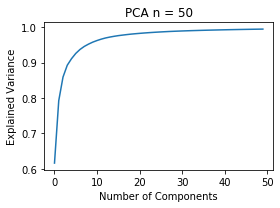

In [15]:
from sklearn.decomposition import PCA

n_components = 50
pca = PCA(n_components=n_components, whiten=True)
Z = pca.fit_transform(Xt)

rng = range(n_components)
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(4, 3))
ax.plot(rng, [np.cumsum(pca.explained_variance_ratio_)[n] for n in rng])
ax.set_title("PCA n = 50")
ax.set_xlabel("Number of Components")
ax.set_ylabel("Explained Variance")
fig.tight_layout()
fig.savefig("images/Molecules-ExplainedVariance.png")
np.sum(pca.explained_variance_ratio_)

Looks like we can explain almost all of the variance with ~50 components. Let's see how these components relate to the energy level.

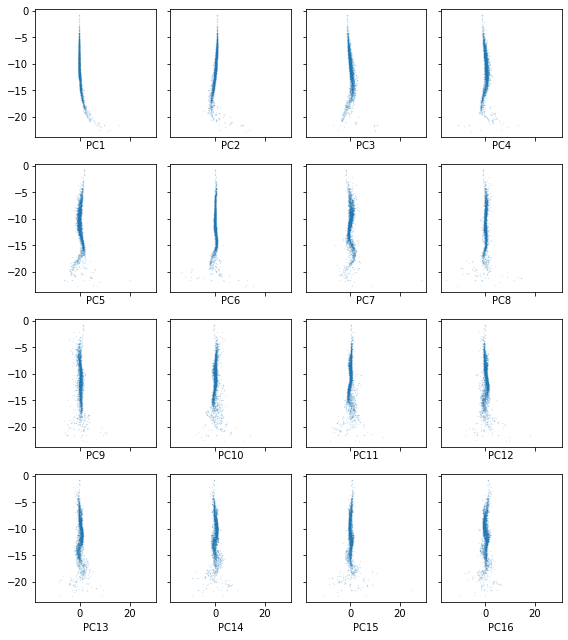

In [14]:
mask_random = np.random.randint(0, Z.shape[0], size=2500)

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(8, 9), sharex=True, sharey=True)
axes = np.array(axes).flatten()
for i in range(16):
    ax = axes[i]
    ax.set_xlabel("PC%s" % (i + 1))
    ax.scatter(Z[:, i][mask_random], y[mask_random], s=0.1, alpha=0.2)
fig.tight_layout()
fig.savefig("images/Molecules-PCA.png")

We will also look at kernel PCA.

In [15]:
from sklearn.decomposition import KernelPCA

mask_random = np.random.randint(0, Xt.shape[0], size=2500)
kpca = KernelPCA(n_components=50, kernel="rbf", gamma=0.0005, random_state=0).fit(Xt[mask_random])
Z = kpca.transform(Xt)
Z.shape

(16242, 50)

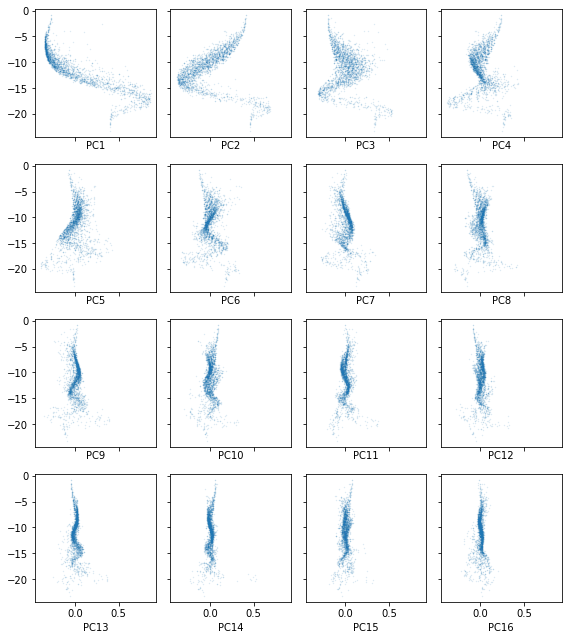

In [16]:
mask_random = np.random.randint(0, Z.shape[0], size=2500)

fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(8, 9), sharex=True, sharey=True)
axes = np.array(axes).flatten()
for i in range(16):
    ax = axes[i]
    ax.set_xlabel("PC%s" % (i + 1))
    ax.scatter(Z[:, i][mask_random], y[mask_random], s=0.1, alpha=0.2)
fig.tight_layout()
fig.savefig("images/Molecules-KPCA.png")

In [17]:
pca = PCA(n_components=50, whiten=True).fit(X_train_std)
Z_train = pca.transform(X_train_std)
Z_test = pca.transform(X_test_std)
Z_train.shape, Z_test.shape

((11369, 50), (4873, 50))

In [18]:
lin = LinearRegression().fit(Z_train, y_train)
print_scores(lin, Z_test, y_test)

LinearRegression
R2 Score:                 0.9476348859984123
Explained Variance Score: 0.9476441183963923
RMSE:                     0.8285132931844633


In [19]:
mask_random = np.random.randint(0, X_train_std.shape[0], size=2500)
kpca = KernelPCA(n_components=50, kernel="rbf", gamma=0.0005, random_state=0).fit(X_train_std[mask_random])
Z_train = kpca.transform(X_train_std)
Z_test = kpca.transform(X_test_std)
Z_train.shape, Z_test.shape

((11369, 50), (4873, 50))

In [20]:
lin = LinearRegression().fit(Z_train, y_train)
print_scores(lin, Z_test, y_test)

LinearRegression
R2 Score:                 0.9760098722525477
Explained Variance Score: 0.9760126792834097
RMSE:                     0.5607828642846646


In [21]:
Z_train = pca.transform(X_train_std)
Z_test = pca.transform(X_test_std)
Z_train.shape, Z_test.shape

((11369, 50), (4873, 50))

In [22]:
from algorithms import SimpleESRegressor
from objectives import RSSObjective

ses = SimpleESRegressor(objective=RSSObjective(), n_iter=150, random_state=0, n_pop=200, sigma=0.2)
ses.fit(Z_train, y_train);

100%|██████████| 150/150 [00:20<00:00,  7.41it/s]


SimpleESRegressor
R2 Score:                 0.7595287810815795
Explained Variance Score: 0.7605488737522115
RMSE:                     1.7754563789162852


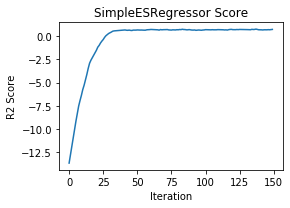

In [23]:
from util import plot_regress

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(4, 3))
plot_regress(ses, Z_test, y_test, ax)
fig.tight_layout()
fig.savefig("images/Molecules-SimpleESRegressor-PCAScoreCurve.png")

Looks like it gets stuck in a happy local optimum. We will switch to kPCA.

In [24]:
Z_train = kpca.transform(X_train_std)
Z_test = kpca.transform(X_test_std)
Z_train.shape, Z_test.shape

((11369, 50), (4873, 50))

In [25]:
ses.fit(Z_train, y_train);

100%|██████████| 150/150 [00:20<00:00,  7.47it/s]


SimpleESRegressor
R2 Score:                 0.9730540465153217
Explained Variance Score: 0.9731178122462719
RMSE:                     0.5943266874339336


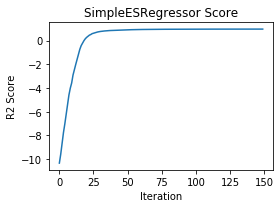

In [26]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(4, 3))
plot_regress(ses, Z_test, y_test, ax)
fig.tight_layout()
fig.savefig("images/Molecules-SimpleESRegressor-kPCAScoreCurve.png")

In [27]:
from algorithms import GeneticESRegressor

ges = GeneticESRegressor(objective=RSSObjective(), n_iter=150, random_state=0, n_pop=200, sigma=0.3)
ges.fit(Z_train, y_train);

100%|██████████| 150/150 [00:17<00:00,  8.39it/s]


GeneticESRegressor
R2 Score:                 0.9687117232322824
Explained Variance Score: 0.9687200299940121
RMSE:                     0.6404264740232258


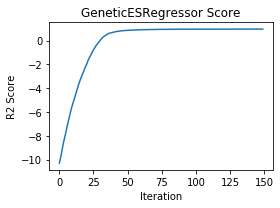

In [28]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(4, 3))
plot_regress(ges, Z_test, y_test, ax)
fig.tight_layout()
fig.savefig("images/Molecules-GeneticESRegressor-kPCAScoreCurve.png")

In [29]:
from algorithms import NaturalESRegressor

nes = NaturalESRegressor(objective=RSSObjective(), n_iter=150, random_state=0, n_pop=200, sigma=0.2)
nes.fit(Z_train, y_train);

100%|██████████| 150/150 [00:20<00:00,  7.36it/s]


NaturalESRegressor
R2 Score:                 0.9442681952098974
Explained Variance Score: 0.9486648509862272
RMSE:                     0.8547320869834397


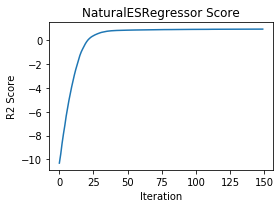

In [30]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(4, 3))
plot_regress(nes, Z_test, y_test, ax)
fig.tight_layout()
fig.savefig("images/Molecules-NaturalESRegressor-kPCAScoreCurve.png")

In [31]:
from algorithms import DifferentialEvolutionRegressor

dev = DifferentialEvolutionRegressor(objective=RSSObjective(), n_iter=1000, random_state=0, n_pop=20, bounds=(-10, 10))
dev.fit(Z_train, y_train);

100%|██████████| 1000/1000 [00:19<00:00, 52.13it/s]


DifferentialEvolutionRegressor
R2 Score:                 0.9760020142525682
Explained Variance Score: 0.9760048377821864
RMSE:                     0.5608746993718275


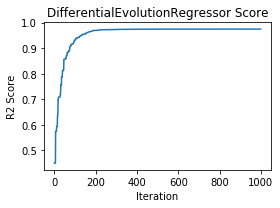

In [32]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(4, 3))
plot_regress(dev, Z_test, y_test, ax)
fig.tight_layout()
fig.savefig("images/Molecules-DifferentialEvolutionRegressor-kPCAScoreCurve.png")

In [33]:
mask_random = np.random.randint(0, X_train_std.shape[0], size=3000)
kpca = KernelPCA(n_components=50, kernel="rbf", gamma=0.0005, random_state=0).fit(X_train_std[mask_random])
Z = kpca.transform(Xt)
Z.shape

(16242, 50)

In [34]:
from sklearn.model_selection import cross_val_score

ses_score = cross_val_score(ses, Z, y)

100%|██████████| 150/150 [00:22<00:00,  6.58it/s]


In [35]:
ges_score = cross_val_score(ges, Z, y)

100%|██████████| 150/150 [00:20<00:00,  7.26it/s]


In [36]:
nes_score = cross_val_score(nes, Z, y)

100%|██████████| 150/150 [00:19<00:00,  7.61it/s]


In [37]:
dev_score = cross_val_score(dev, Z, y)

100%|██████████| 1000/1000 [00:29<00:00, 33.43it/s]


In [38]:
lin_score = cross_val_score(lin, Z, y)

In [39]:
print("SimpleESRegressor R2 Score:               %0.5f (+/- %0.5f)" % (ses_score.mean(), ses_score.std() * 2))
print("GeneticESRegressor R2 Score:              %0.5f (+/- %0.5f)" % (ges_score.mean(), ges_score.std() * 2))
print("NaturalESRegressor R2 Score:              %0.5f (+/- %0.5f)" % (nes_score.mean(), nes_score.std() * 2))
print("DifferentialEvolutionRegressor R2 Score:  %0.5f (+/- %0.5f)" % (dev_score.mean(), dev_score.std() * 2))
print("LinearRegression R2 Score:                %0.5f (+/- %0.5f)" % (lin_score.mean(), lin_score.std() * 2))

SimpleESRegressor R2 Score:               0.97382 (+/- 0.01514)
GeneticESRegressor R2 Score:              0.96069 (+/- 0.01815)
NaturalESRegressor R2 Score:              0.93126 (+/- 0.03337)
DifferentialEvolutionRegressor R2 Score:  0.97654 (+/- 0.01404)
LinearRegression R2 Score:                0.97651 (+/- 0.01405)
